In [1]:
# Step 1: Imports
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras import layers, Model, backend as K
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.preprocessing import image

# Step 2: Load and preprocess images
dataset_path = r'E:\Retina_Stare_dataset\dataset\train_images'  # <-- Adjust if needed
img_size = (128, 128)
train_imgs = []

for img_name in os.listdir(dataset_path):
    img_path = os.path.join(dataset_path, img_name)
    
    # Skip non-image files
    if not img_name.lower().endswith(('.jpg', '.jpeg', '.png','.ppm')):
        continue

    try:
        img = image.load_img(img_path, target_size=img_size)
        img_array = image.img_to_array(img) / 255.0  # Normalize

        # Ensure consistent shape
        if img_array.shape == (128, 128, 3):
            train_imgs.append(img_array)
        else:
            print(f"Skipping {img_name}: shape {img_array.shape}")
    except Exception as e:
        print(f"Error loading {img_name}: {e}")

train_imgs = np.array(train_imgs, dtype=np.float32)
print("Final train images shape:", train_imgs.shape)



Final train images shape: (397, 128, 128, 3)


In [2]:
class Retina_Autoencoder:
    def __init__(self, input_dim):
        self.input_dim = input_dim

    def build(self):
        encoder_input = layers.Input(shape=self.input_dim, name='encoder_input')

        # Encoder
        c1 = layers.Conv2D(64, (3, 3), strides=1, padding='same', activation='relu')(encoder_input)
        p1 = layers.MaxPooling2D((2, 2))(c1)

        c2 = layers.Conv2D(128, (3, 3), strides=1, padding='same', activation='relu')(p1)
        p2 = layers.MaxPooling2D((2, 2))(c2)

        c3 = layers.Conv2D(256, (3, 3), strides=1, padding='same', activation='relu')(p2)
        p3 = layers.MaxPooling2D((2, 2))(c3)

        # Bottleneck
        b = layers.Conv2D(512, (3, 3), strides=1, padding='same', activation='relu')(p3)

        # Decoder with skip connections
        u3 = layers.UpSampling2D((2, 2))(b)
        m3 = layers.Concatenate()([u3, c3])
        d3 = layers.Conv2D(256, (3, 3), padding='same', activation='relu')(m3)

        u2 = layers.UpSampling2D((2, 2))(d3)
        m2 = layers.Concatenate()([u2, c2])
        d2 = layers.Conv2D(128, (3, 3), padding='same', activation='relu')(m2)

        u1 = layers.UpSampling2D((2, 2))(d2)
        m1 = layers.Concatenate()([u1, c1])
        d1 = layers.Conv2D(64, (3, 3), padding='same', activation='relu')(m1)

        decoder_output = layers.Conv2D(3, (3, 3), padding='same', activation='sigmoid')(d1)

        ae = Model(encoder_input, decoder_output, name='Retina_Autoencoder')
        print(ae.summary())
        return ae


In [3]:
IMG_SHAPE = (128, 128, 3)
retina_ae = Retina_Autoencoder(input_dim=IMG_SHAPE)
model = retina_ae.build()

# Compile the model with MSE loss (or replace with SSIM/perceptual loss for better sharpness)
model.compile(optimizer='adam', loss='mse')

Model: "Retina_Autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ encoder_input       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │      1,792 │ encoder_input[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ conv2d[0][0]      │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 64, 64,    │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 32, 32,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 16, 16,    │          0 │ conv2d_2[0][0]    │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 16, 16,    │  1,180,160 │ max_pooling2d_2[… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d       │ (None, 32, 32,    │          0 │ conv2d_3[0][0]    │
│ (UpSampling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 32, 32,    │          0 │ up_sampling2d[0]… │
│ (Concatenate)       │ 768)              │            │ conv2d_2[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 32, 32,    │  1,769,728 │ concatenate[0][0] │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_1     │ (None, 64, 64,    │          0 │ conv2d_4[0][0]    │
│ (UpSampling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 64, 64,    │          0 │ up_sampling2d_1[… │
│ (Concatenate)       │ 384)              │            │ conv2d_1[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 64, 64,    │    442,496 │ concatenate_1[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_2     │ (None, 128, 128,  │          0 │ conv2d_5[0][0]    │
│ (UpSampling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 128, 128,  │          0 │ up_sampling2d_2[… │
│ (Concatenate)       │ 192)              │            │ conv2d[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 128, 128,  │    110,656 │ concatenate_2[0]

 Total params: 3,875,587 (14.78 MB)

 Trainable params: 3,875,587 (14.78 MB)

 Non-trainable params: 0 (0.00 B)

None


In [5]:
class ShowLearning(Callback):
    def on_epoch_end(self, epoch, logs=None):
        original_imgs = train_imgs[:4]
        decoded_imgs = model.predict(original_imgs)

        plt.figure(figsize=(20, 7))
        for i in range(4):
            ax = plt.subplot(2, 4, i + 1)
            plt.imshow(original_imgs[i])
            plt.title("Original")
            plt.axis("off")

            ax = plt.subplot(2, 4, i + 5)
            plt.imshow(decoded_imgs[i])
            plt.title("Reconstructed")
            plt.axis("off")

        plt.tight_layout()
        plt.show()

callbacks = [ShowLearning()]


Epoch 1/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - loss: 0.0880


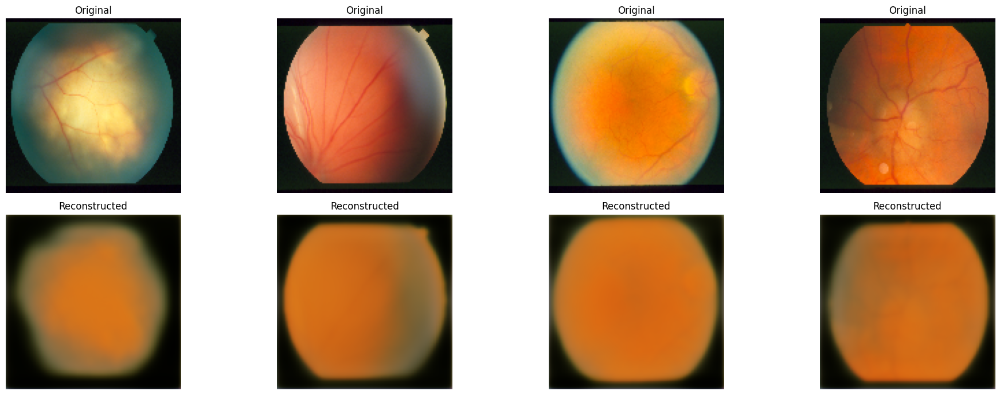

25/25 ━━━━━━━━━━━━━━━━━━━━ 410s 17s/step - loss: 0.0867
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/steptep - loss: 0.0085


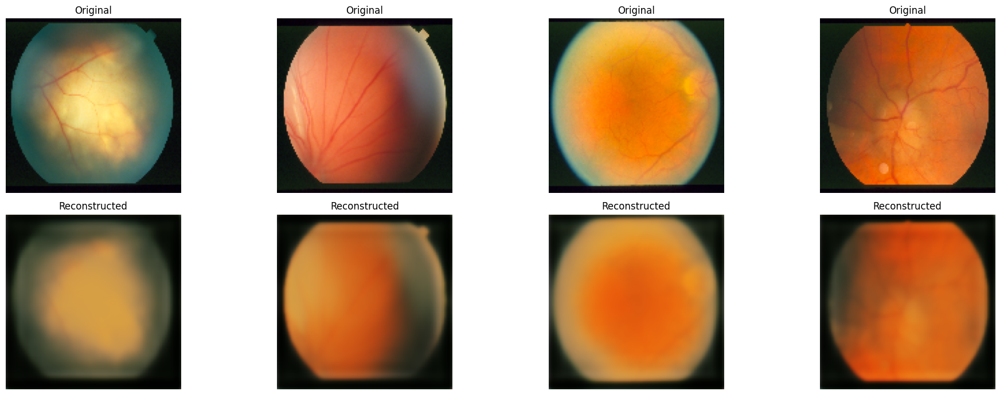

25/25 ━━━━━━━━━━━━━━━━━━━━ 521s 19s/step - loss: 0.0084
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/steptep - loss: 0.0034


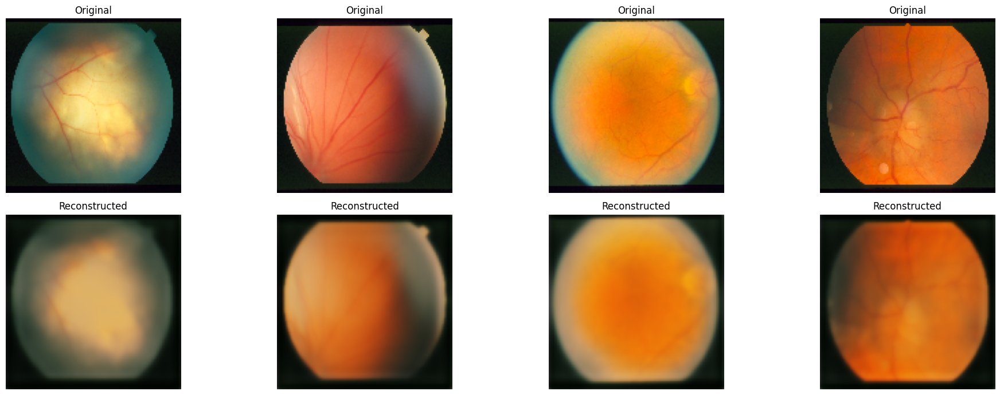

25/25 ━━━━━━━━━━━━━━━━━━━━ 509s 20s/step - loss: 0.0034
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step- loss: 0.00


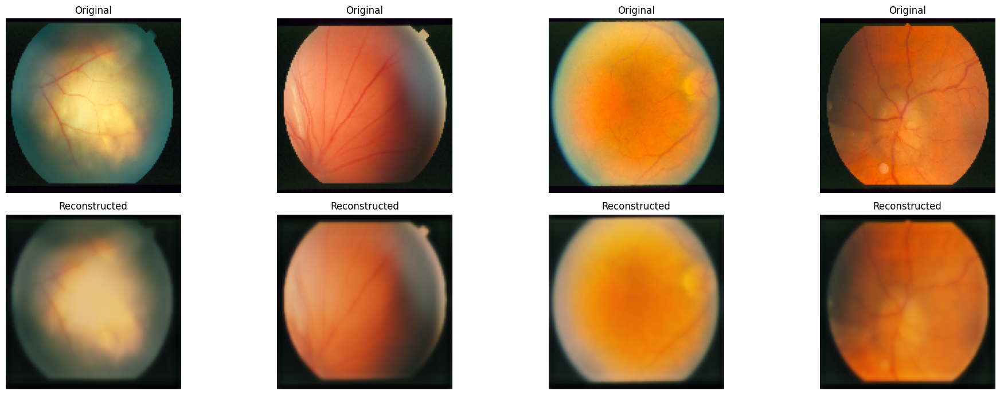

25/25 ━━━━━━━━━━━━━━━━━━━━ 296s 9s/step - loss: 0.0026
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step- loss: 0.00


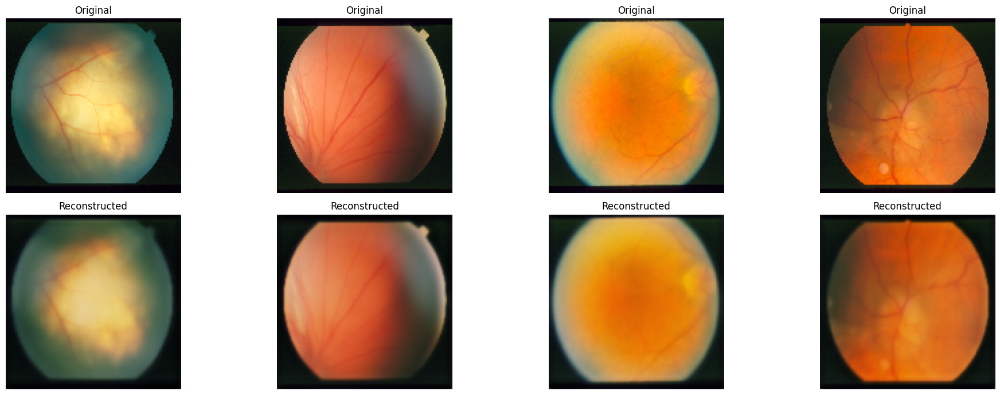

25/25 ━━━━━━━━━━━━━━━━━━━━ 135s 5s/step - loss: 0.0014
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step- loss: 0.00


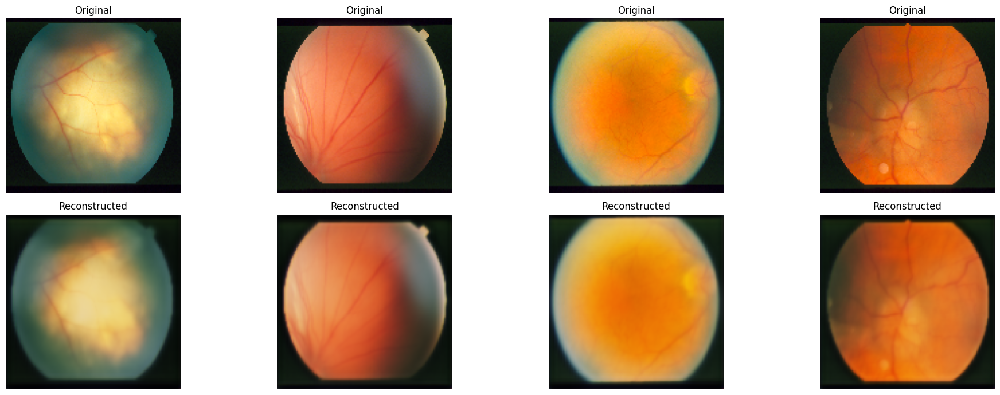

25/25 ━━━━━━━━━━━━━━━━━━━━ 134s 5s/step - loss: 0.0012
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step- loss: 8.8785e-


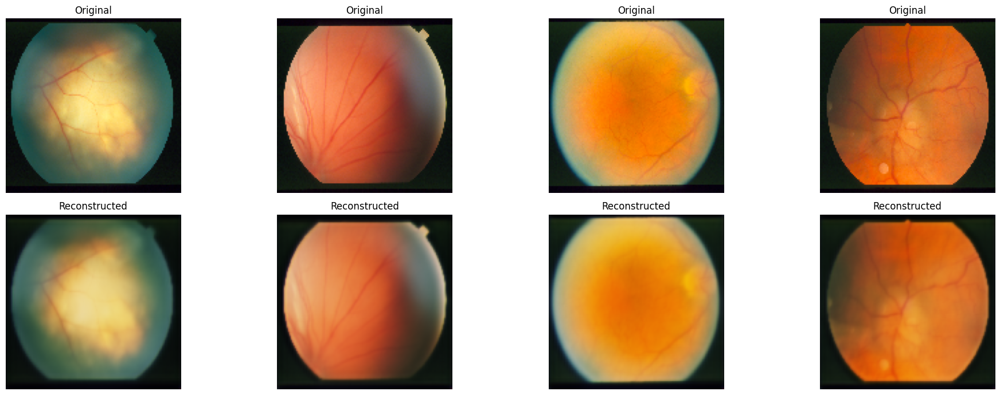

25/25 ━━━━━━━━━━━━━━━━━━━━ 131s 5s/step - loss: 8.8797e-04
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step- loss: 8.4173e-


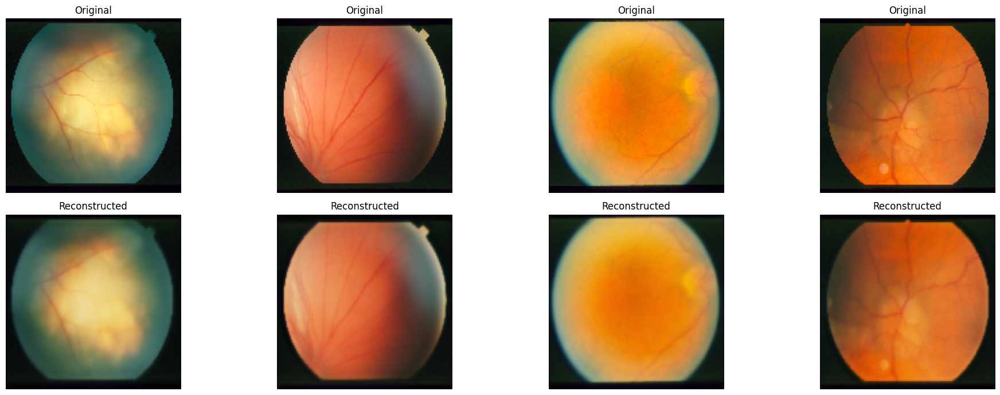

25/25 ━━━━━━━━━━━━━━━━━━━━ 129s 5s/step - loss: 8.3994e-04
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step- loss: 6.3808e-


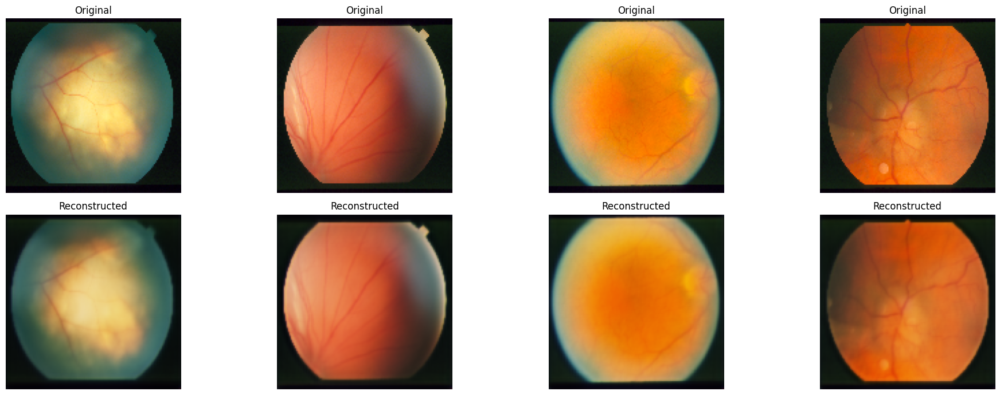

25/25 ━━━━━━━━━━━━━━━━━━━━ 128s 5s/step - loss: 6.3814e-04
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step- loss: 6.2583e-


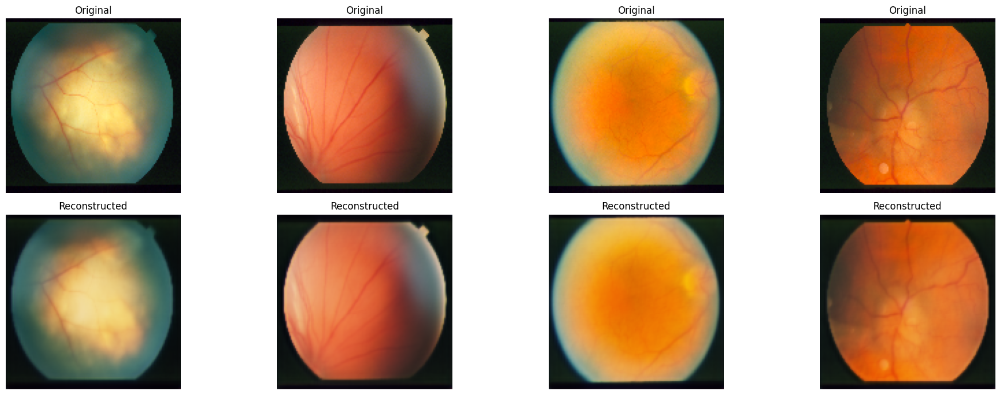

25/25 ━━━━━━━━━━━━━━━━━━━━ 140s 6s/step - loss: 6.2692e-04
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step- loss: 5.4476e-


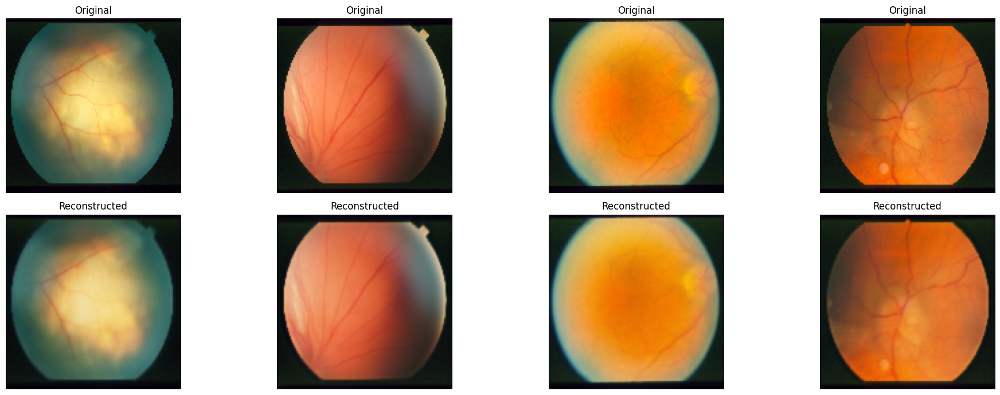

25/25 ━━━━━━━━━━━━━━━━━━━━ 147s 6s/step - loss: 5.4441e-04
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step- loss: 5.5552e-


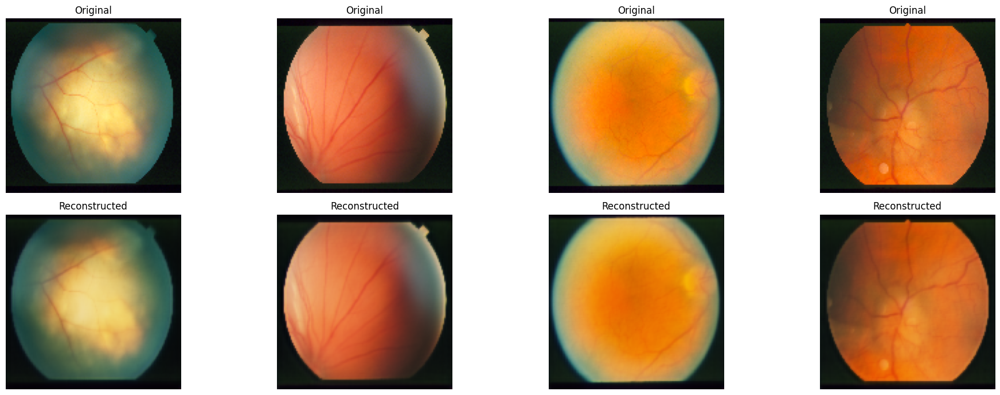

25/25 ━━━━━━━━━━━━━━━━━━━━ 175s 5s/step - loss: 5.5605e-04
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step- loss: 5.2022e-


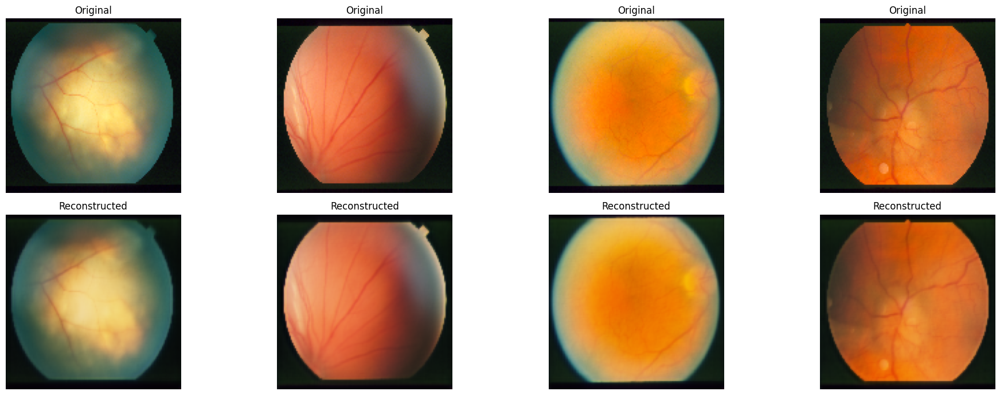

25/25 ━━━━━━━━━━━━━━━━━━━━ 141s 6s/step - loss: 5.1831e-04
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step- loss: 3.9395e-


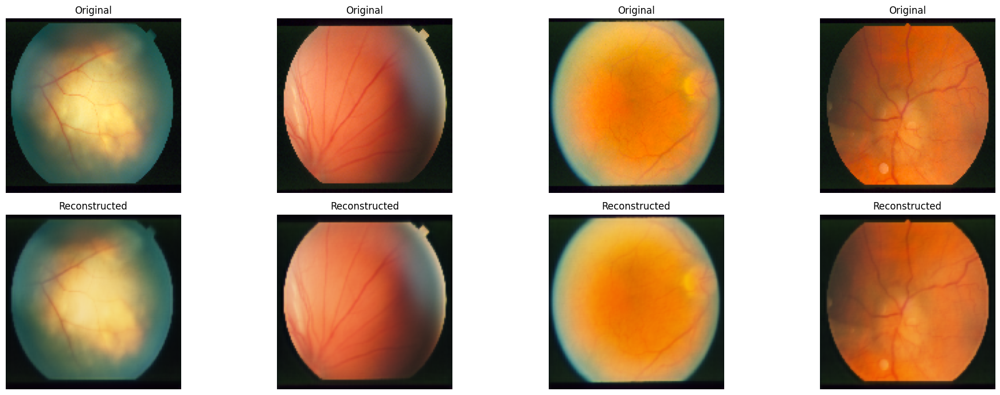

25/25 ━━━━━━━━━━━━━━━━━━━━ 102s 4s/step - loss: 3.9378e-04
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step- loss: 3.4169e-


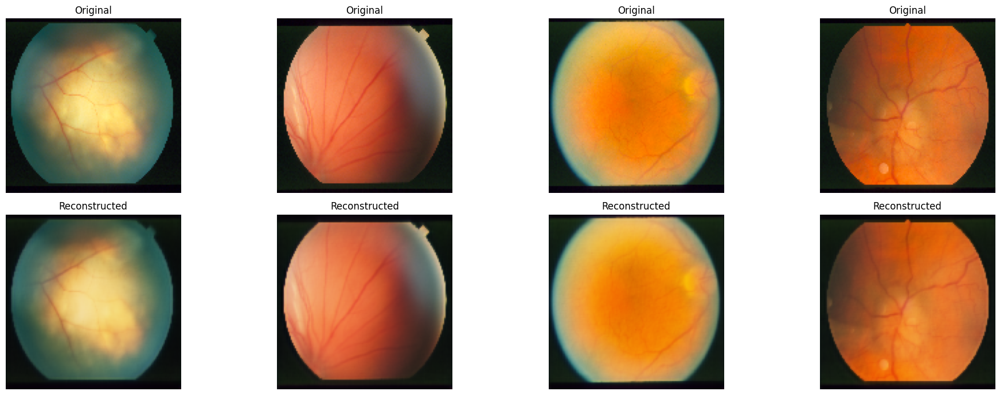

25/25 ━━━━━━━━━━━━━━━━━━━━ 141s 4s/step - loss: 3.4191e-04
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step- loss: 3.5979e-


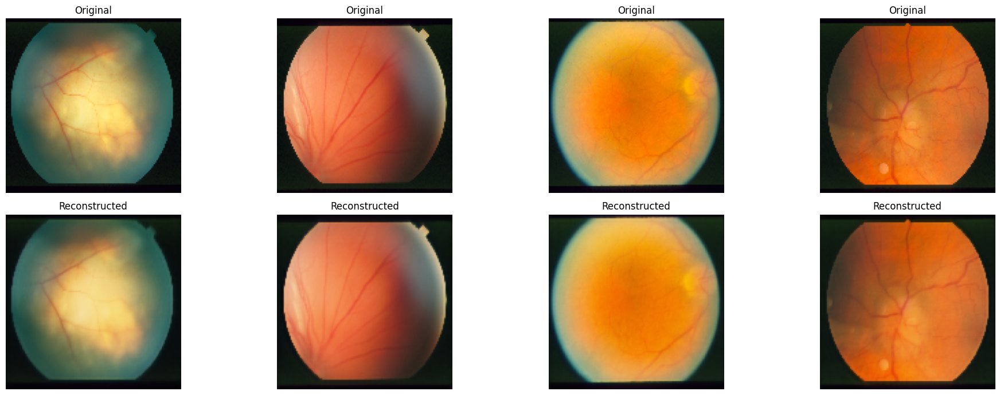

25/25 ━━━━━━━━━━━━━━━━━━━━ 102s 4s/step - loss: 3.6112e-04
Epoch 17/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step- loss: 3.8925e-


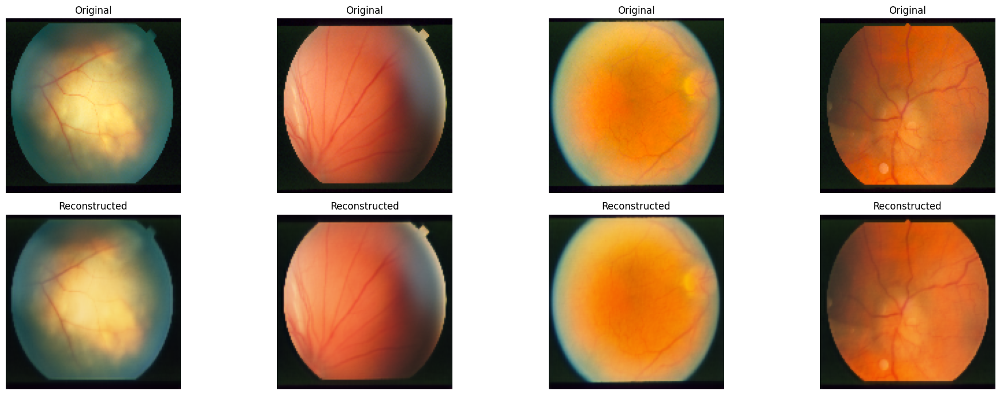

25/25 ━━━━━━━━━━━━━━━━━━━━ 102s 4s/step - loss: 3.8887e-04
Epoch 18/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step- loss: 3.2452e-


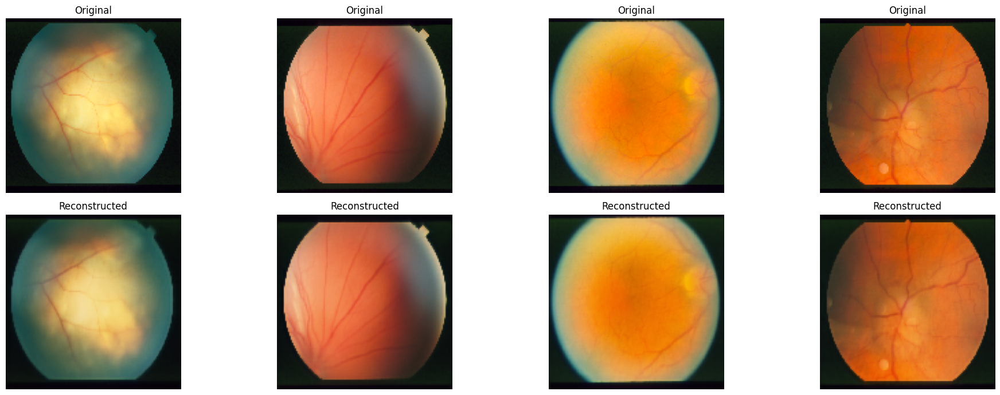

25/25 ━━━━━━━━━━━━━━━━━━━━ 105s 4s/step - loss: 3.2377e-04
Epoch 19/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step- loss: 2.5139e-


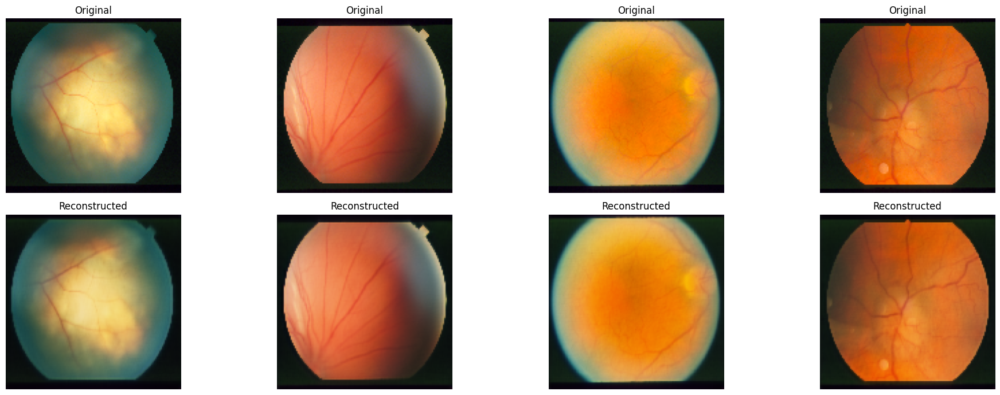

25/25 ━━━━━━━━━━━━━━━━━━━━ 101s 4s/step - loss: 2.5133e-04
Epoch 20/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step- loss: 2.9786e-


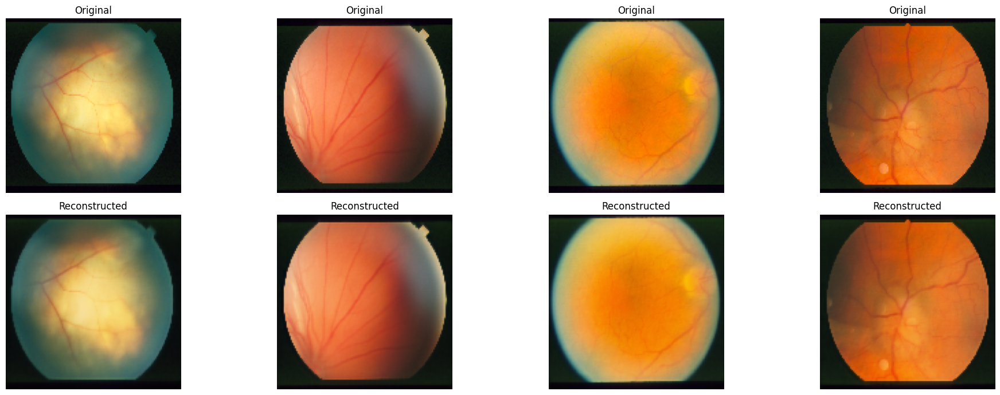

25/25 ━━━━━━━━━━━━━━━━━━━━ 102s 4s/step - loss: 2.9751e-04


In [6]:
# Step 6: Train the model
EPOCHS = 20
BS = 16

# Final shape check before training
assert train_imgs.ndim == 4 and train_imgs.shape[1:] == (128, 128, 3), "Image data shape is incorrect!"

history = model.fit(
    train_imgs,
    train_imgs,
    epochs=EPOCHS,
    batch_size=BS,
    shuffle=True,
    callbacks=callbacks
)


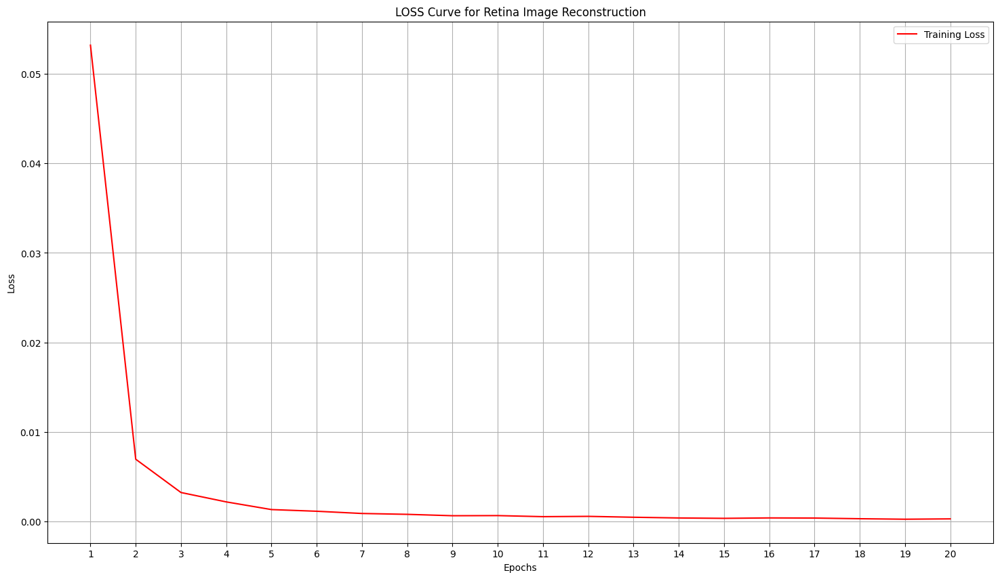

In [7]:
# Extract training loss
train_loss = history.history["loss"]
epochs = list(range(1, EPOCHS + 1))

# Plotting training loss curve
plt.figure(figsize=(18, 10))
plt.plot(epochs, train_loss, '-r', label="Training Loss")
plt.title("LOSS Curve for Retina Image Reconstruction")
plt.grid(True)
plt.xlabel('Epochs')
plt.ylabel("Loss")
plt.legend()
plt.xticks(epochs)
plt.show()
